In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
from torch.nn import Module
import torch
import torch.nn as nn
import torch.optim as optim
import shutil
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from PIL import Image
from torchvision import models, transforms
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [3]:
car = pd.read_csv('../data/companies.csv')
car.head(20)

,rank,logo_link,origin,name,segment
0,1,https://www.carlogos.org/car-logos/toyota-logo...,Japan,Toyota,Mass-Market Cars
1,2,https://www.carlogos.org/car-logos/honda-logo.png,Japan,Honda,Mass-Market Cars
2,3,https://www.carlogos.org/car-logos/chevrolet-l...,United States,Chevrolet,Mass-Market Cars
3,4,https://www.carlogos.org/car-logos/ford-logo.png,United States,Ford,Mass-Market Cars
4,5,https://www.carlogos.org/car-logos/mercedes-be...,Germany,Mercedes-Benz,Luxury Vehicles
5,6,https://www.carlogos.org/car-logos/jeep-logo.png,United States,Jeep,Sport Utility Vehicles
6,7,https://www.carlogos.org/car-logos/bmw-logo.png,Germany,BMW,Luxury Vehicles
7,8,https://www.carlogos.org/car-logos/porsche-log...,Germany,Porsche,Luxury Sports Cars
8,9,https://www.carlogos.org/car-logos/subaru-logo...,Japan,Subaru,Mass-Market Cars
9,10,https://www.carlogos.org/car-logos/nissan-logo...,Japan,Nissan,Mass-Market Cars


# Load and transform images into a Pytorch dataset

In [4]:
# New image transformation (with augmentation)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),  # Data augmentation
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Pytorch dataset
class CarDb(Dataset):
    def __init__(self, car_list, label_encoder=None, transform=None):
        self.file_path = [path for path, _ in car_list if torchvision.io.read_image(path).shape[0] == 3]
        self.labels = [label for path, label in car_list if torchvision.io.read_image(path).shape[0] == 3]
        if label_encoder:
            self.label_encoder = label_encoder
        else:
            label_encoder = LabelEncoder()
            self.label_encoder = label_encoder.fit(self.labels)
        self.raw_labels = self.label_encoder.transform(self.labels)
    
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
    # retrieves a single sample (image, label)
        label = self.raw_labels[idx]
        file_path = self.file_path[idx]
        img = Image.open(file_path)
        img = transform(img) # squared, rescaled image 124x124
        return img, label
    
    def class_names(self):
        return list(self.label_encoder.classes_)

In [5]:
# Iterate all folders and files and create the dataset
data_dir = "../data/imgs_zip/imgs/"
car_list = [(os.path.join(data_dir, folder_path,file),folder_path) for folder_path in os.listdir(data_dir)
            if os.path.isdir(os.path.join(data_dir, folder_path))  # Check if it's a directory
            for file in os.listdir(os.path.join(data_dir, folder_path))
            if file.endswith('.jpg')]

# Create dataset
label_encoder = LabelEncoder()
label_encoder.fit([label for _, label in car_list])  # optional if you want full control

cardb = CarDb(car_list, label_encoder=label_encoder, transform=transform)
len(cardb)

4597

# Visualize some random images

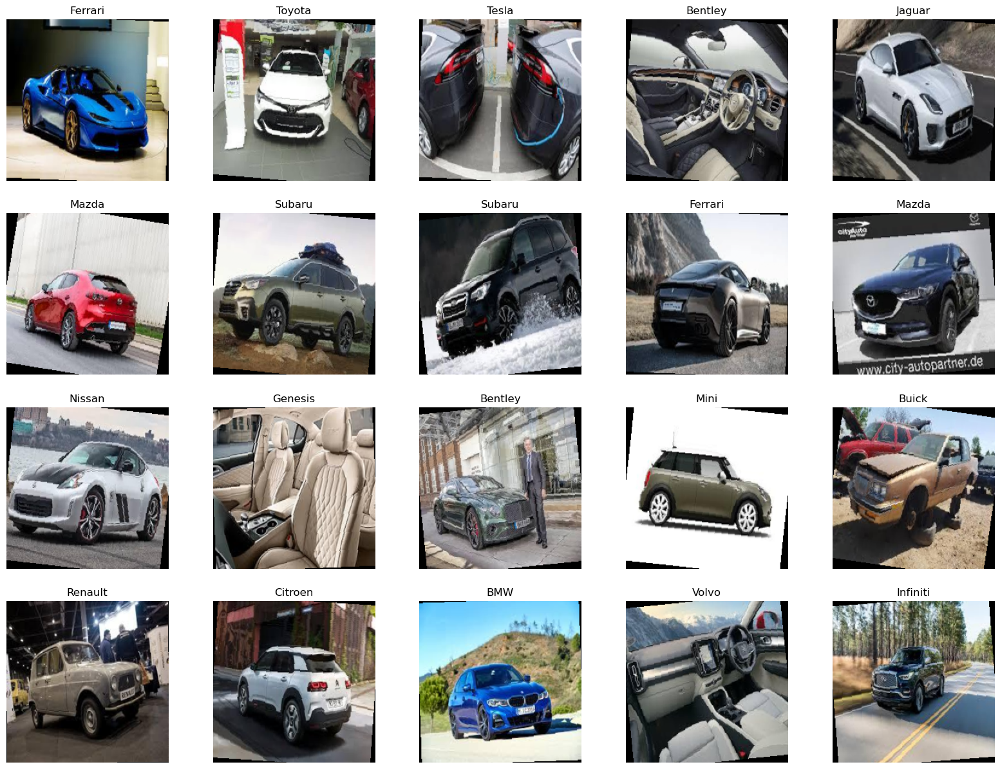

In [6]:
def denormalize(img):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    img = img * std[:, None, None] + mean[:, None, None]  # Undo normalization
    return img.clamp(0, 1)  # Ensure values are in the range [0, 1]

N = len(cardb)
samples = [random.randint(0, N - 1) for _ in range(20)] # retrieve 20 random samples

plt.figure(figsize=(20,15))
for i, idx in enumerate(samples):
    img, label = cardb[idx]
    plt.subplot(4,5,i+1)
    plt.imshow(denormalize(img).squeeze().permute(1, 2, 0).numpy())
    plt.axis('off')
    plt.title(cardb.label_encoder.inverse_transform([label])[0])
    
# Optionally save figure
#plt.tight_layout()
#plt.savefig("../docs/figures/initial_sample.png")

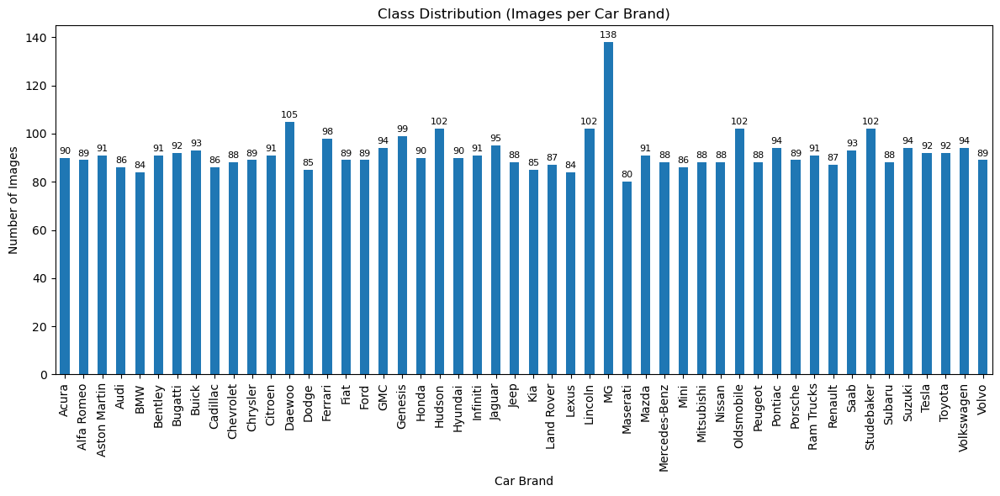

In [8]:
# Convert labels list to pandas Series
label_series = pd.Series(cardb.labels)

# Count occurrences and sort
label_counts = label_series.value_counts().sort_index()

# Plot
ax = label_counts.plot(kind='bar', figsize=(12, 6))
plt.title("Class Distribution (Images per Car Brand)")
plt.xlabel("Car Brand")
plt.ylabel("Number of Images")
plt.xticks(rotation=90)

# Add annotations
for i, count in enumerate(label_counts):
    ax.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig("../docs/figures/initial_class_distribution.png")
plt.show()

# Detecting outliers

## 1. Unsupervised Clustering

In [9]:
# Load pretrained ResNet50
model = models.resnet50(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])  # Remove the final classification layer
model.eval()

# 1. Extract features
def extract_feature(image):
    with torch.no_grad():
        feature = model(image.unsqueeze(0)).squeeze().numpy()
    return feature

def extract_features_from_dataset(dataset):
    features = []
    file_paths = []

    for idx in range(len(dataset)):
        img, _ = dataset[idx]
        feature = extract_feature(img)
        features.append(feature)
        file_paths.append(dataset.file_path[idx])

    return torch.tensor(features), file_paths

/home/eqa7yg/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/eqa7yg/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [10]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 2. Cluster features
def cluster_features(reduced_features, n_clusters=5):
    # K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(reduced_features)
    return clusters

# 3. Visualize clusters
def visualize_clusters(dataset, clusters, file_paths, n_samples=5):
    unique_clusters = set(clusters.tolist())
    for cluster_id in unique_clusters:
        print(f"\nCluster {cluster_id}:")
        cluster_images = [file_paths[i] for i, c in enumerate(clusters) if c == cluster_id][:n_samples]

        plt.figure(figsize=(15, 5))
        for j, img_path in enumerate(cluster_images):
            try:
                img = Image.open(img_path)
                plt.subplot(1, n_samples, j + 1)
                plt.imshow(img)
                plt.title(f"Cluster {cluster_id}")
                plt.axis('off')
            except Exception as e:
                print(f"Error displaying image {img_path}: {e}")
        plt.show()

In [11]:
# Step 1: Extract features
features, file_paths = extract_features_from_dataset(cardb)

/tmp/ipykernel_565341/2842624274.py:22: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  return torch.tensor(features), file_paths


/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 0:


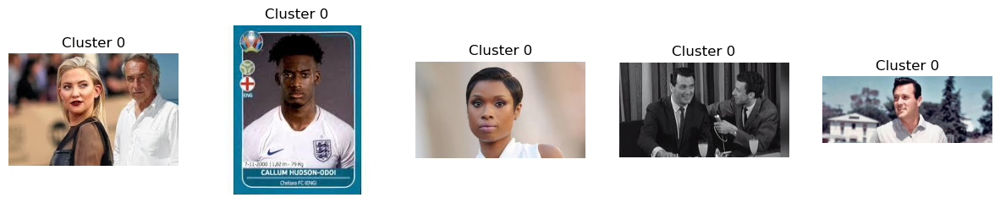


Cluster 1:


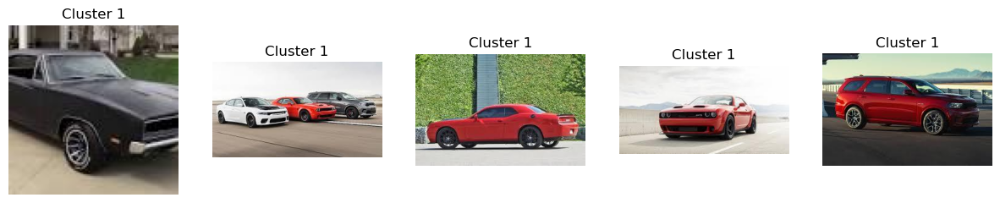


Cluster 2:


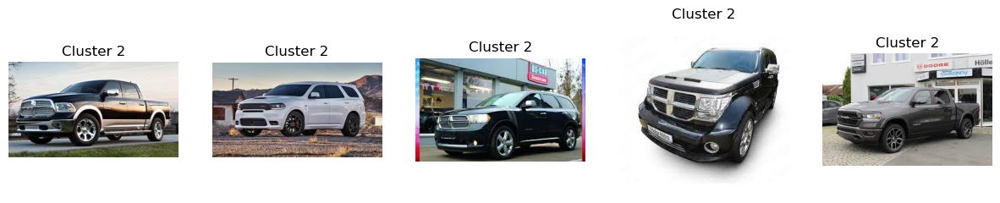


Cluster 3:


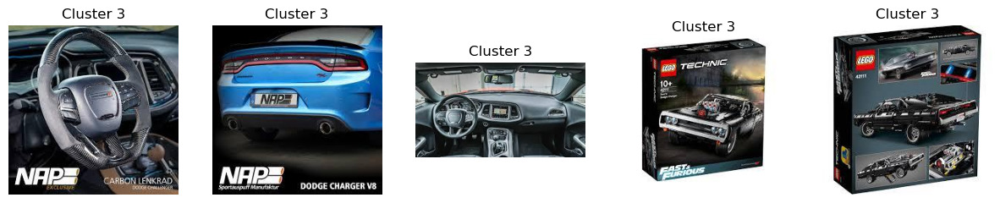


Cluster 4:


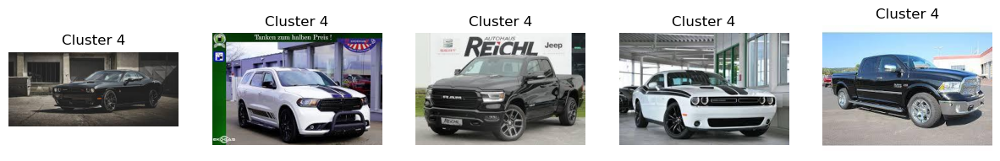


Cluster 5:


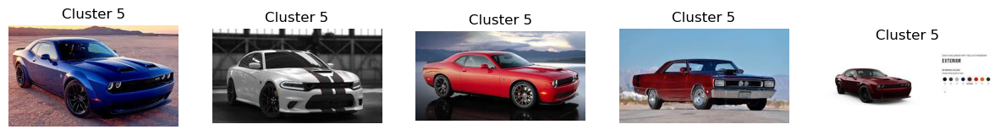

In [12]:
# Step 2: Cluster features
# 2.1. Dimensionality reduction for clustering
pca = PCA(n_components=50)
reduced_features = pca.fit_transform(features)
# 2.2. K-Means clustering
clusters = cluster_features(reduced_features, 6)

# Step 3: Visualize clusters
visualize_clusters(cardb, clusters, file_paths)


Cluster 0:


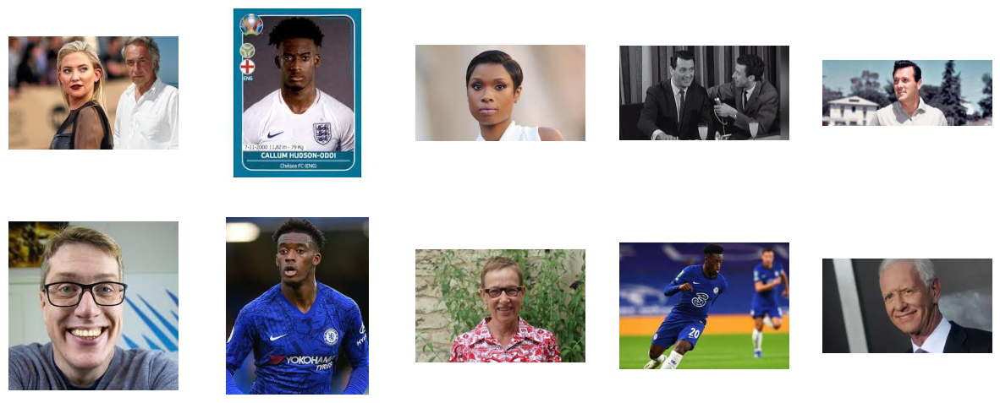

In [40]:
unique_clusters = set(clusters.tolist())
FACE_CLUSTER_ID = 0
n_samples = 10
n_rows = 2

print(f"\nCluster {FACE_CLUSTER_ID}:")
cluster_images = [file_paths[i] for i, c in enumerate(clusters) if c == FACE_CLUSTER_ID][:n_samples]

plt.figure(figsize=(15, 6))
for j, img_path in enumerate(cluster_images):
    try:
        img = Image.open(img_path)
        plt.subplot(n_rows, n_samples//n_rows, j + 1)
        plt.imshow(img)
        plt.axis('off')
    except Exception as e:
        print(f"Error displaying image {img_path}: {e}")
plt.savefig("../docs/figures/face_cluster.png")
plt.show()

In [29]:
# Rename face_cluster_id with face_cluster
cluster_map = {FACE_CLUSTER_ID: 'face_cluster'}
mapped_clusters = np.vectorize(lambda x: cluster_map.get(x, x), otypes=[object])(clusters)

# Create binary labels for hue property
cluster_labels = np.where(clusters == FACE_CLUSTER_ID, 'face', 'not face')

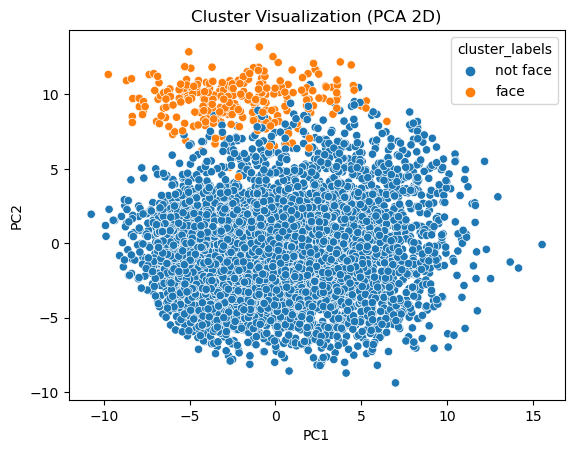

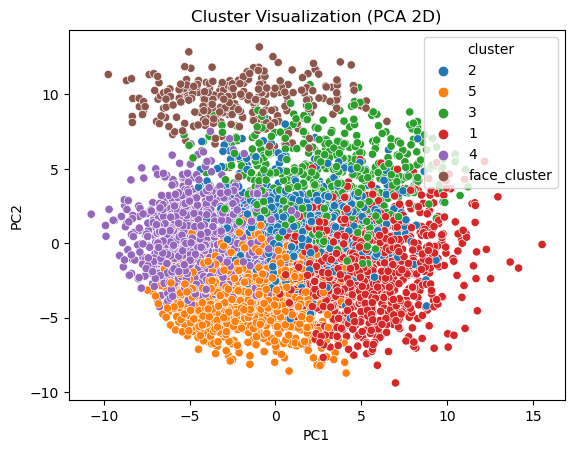

In [31]:
PCA_plot = pd.DataFrame(reduced_features[:, :2], columns = ["PC1", "PC2"])
PCA_plot['cluster'] = mapped_clusters
PCA_plot['cluster_labels'] = cluster_labels

# Plot face vs no-face clusters
sns.scatterplot(data = PCA_plot, x = "PC1", y = "PC2", hue = "cluster_labels", palette = "tab10")
plt.title("Cluster Visualization (PCA 2D)")
plt.show()

# Plot all clusters
sns.scatterplot(data = PCA_plot, x = "PC1", y = "PC2", hue = "cluster", palette = "tab10")
plt.title("Cluster Visualization (PCA 2D)")
plt.savefig("../docs/figures/clustering_result.png")
plt.show()

### FILTER #1: Remove cluster #4 from our dataset

In [38]:
# Filter our images in FACE_CLUSTER_ID
filtered_indices = [idx for idx, cluster in enumerate(clusters) if cluster != FACE_CLUSTER_ID]
filtered_car_list = [(cardb.file_path[i], cardb.labels[i]) for i in filtered_indices]

# Create a new dataset instance
filtered_cardb = CarDb(filtered_car_list, label_encoder=label_encoder, transform=transform)

In [39]:
print(len(cardb.labels) - len(filtered_cardb.labels), ' images filtered.')

274  images filtered.


## 2. ResNet2 Pretrained labels

In [43]:
import urllib.request

# Download list of ImageNet classes labels
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
urllib.request.urlretrieve(url, "imagenet_classes.txt")
print("Downloaded ImageNet class labels.")

# Load labels from .txt file
LABELS = {n: label.strip() for n, label in enumerate(open("imagenet_classes.txt"))}

list(LABELS.items())[:10]

Downloaded ImageNet class labels.


[(0, 'tench'),
 (1, 'goldfish'),
 (2, 'great white shark'),
 (3, 'tiger shark'),
 (4, 'hammerhead'),
 (5, 'electric ray'),
 (6, 'stingray'),
 (7, 'cock'),
 (8, 'hen'),
 (9, 'ostrich')]

In [44]:
# Load pretrained ResNet50
model = models.resnet50(pretrained=True)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [48]:
car_keywords = [
    "convertible", "minivan", "taxi", "cab", "limousine", "trailer truck","racer","moving van",
    "race car", "sports car", "jeep", "pickup", "SUV", "wagon", "beach wagon","recreational vehicle","golfcart",
    "police car", "ambulance", "fire truck", "tow truck", "truck", "bus", "van","car wheel","minibus","passenger car"
]

def predict_image(image):
    try:
        with torch.no_grad():
            outputs = model(image.unsqueeze(0))
        _, predicted = outputs.max(1)
        label = LABELS[predicted.item()]
        return label
    except Exception as e:
        print(f"Error processing {image}: {e}")
        return None
    
def filter_non_car_images(dataset, keywords):
    non_car_images = []

    for idx in range(len(dataset)):
        img, label = dataset[idx]
        predicted_label = predict_image(img) # Predict the label using the model
        if predicted_label not in keywords: # Check if the predicted label is not related to a car
            non_car_images.append((dataset.file_path[idx], predicted_label))
    print(f"\nTotal non-car images detected: {len(non_car_images)}")
    return non_car_images

# 2nd Filter: Filter using keywords and ResNet model predictions
noncar_list = filter_non_car_images(filtered_cardb, car_keywords)
noncardb = CarDb(noncar_list, transform=transform)


Total non-car images detected: 668


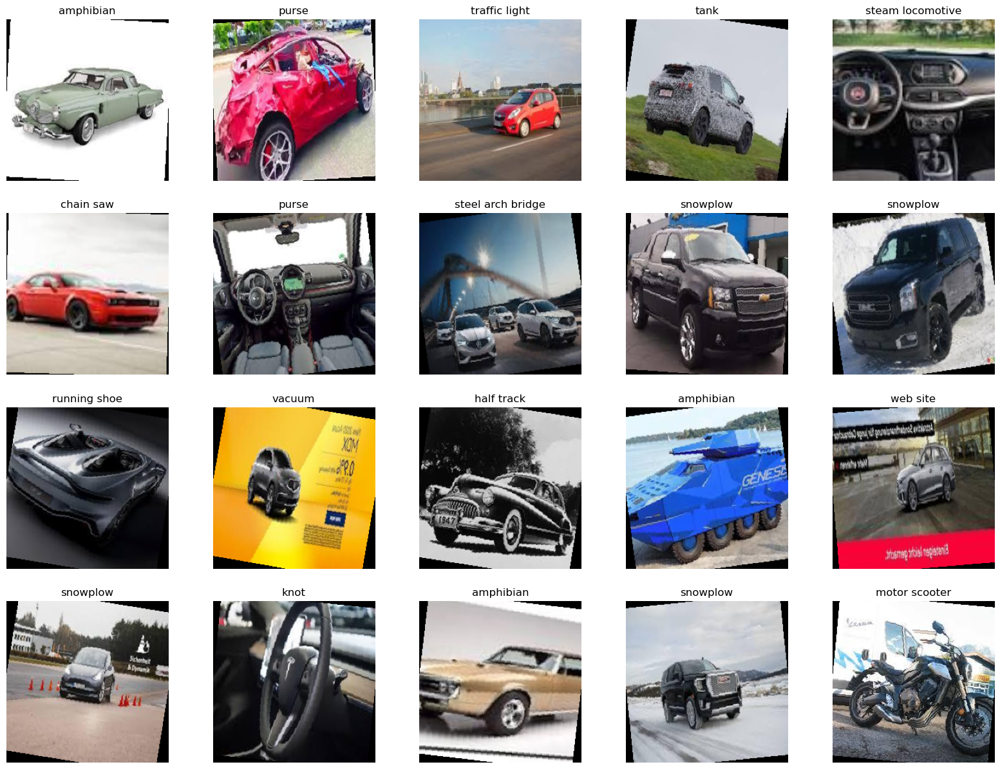

In [53]:
# Explore detected non car images
N = len(noncardb)
samples = [random.randint(0, N - 1) for _ in range(20)] # retrieve 20 random samples
    
plt.figure(figsize=(20,15))
for i, idx in enumerate(samples):
    img, label = noncardb[idx]
    plt.subplot(4,5,i+1)
#    plt.imshow(img.permute(1,2,0).numpy())
    plt.imshow(denormalize(img).squeeze().permute(1, 2, 0).numpy())
    plt.axis('off')
    plt.title(noncardb.label_encoder.inverse_transform([label])[0])

chain saw          60
grille             46
web site           42
snowplow           42
amphibian          38
car mirror         35
moped              22
tank               20
half track         17
snowmobile         16
crash helmet       15
cassette player    14
buckle             14
forklift           13
Model T             9
Name: count, dtype: int64


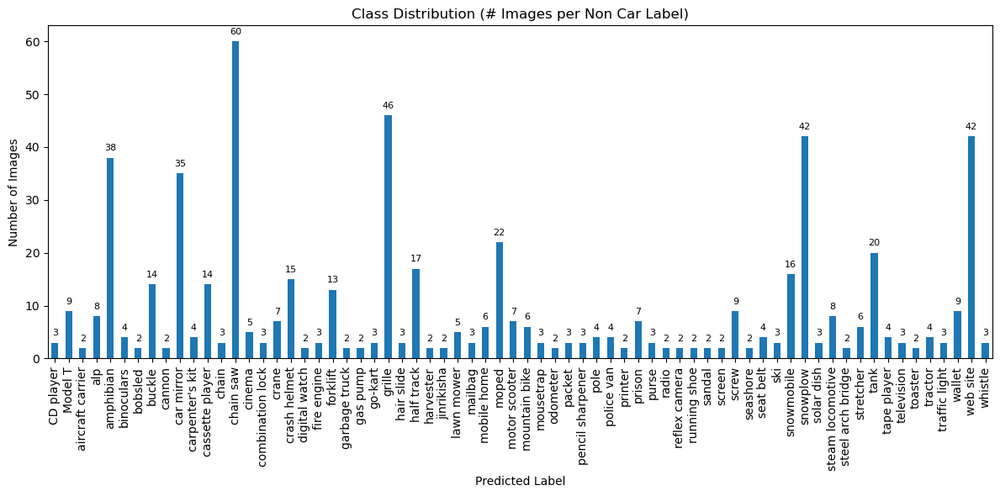

In [54]:
print(pd.Series(noncardb.labels).value_counts().sort_values(ascending = False).head(15))

label_counts = pd.Series(noncardb.labels).value_counts().sort_index()
label_counts = label_counts[label_counts > 1] # too many labels, plot only > 1 image
# Plot
ax = label_counts.plot(kind='bar', figsize=(12, 6))
plt.title("Class Distribution (# Images per Non Car Label)")
plt.xlabel("Predicted Label")
plt.ylabel("Number of Images")
plt.xticks(rotation=90)

# Add annotations
for i, count in enumerate(label_counts):
    ax.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

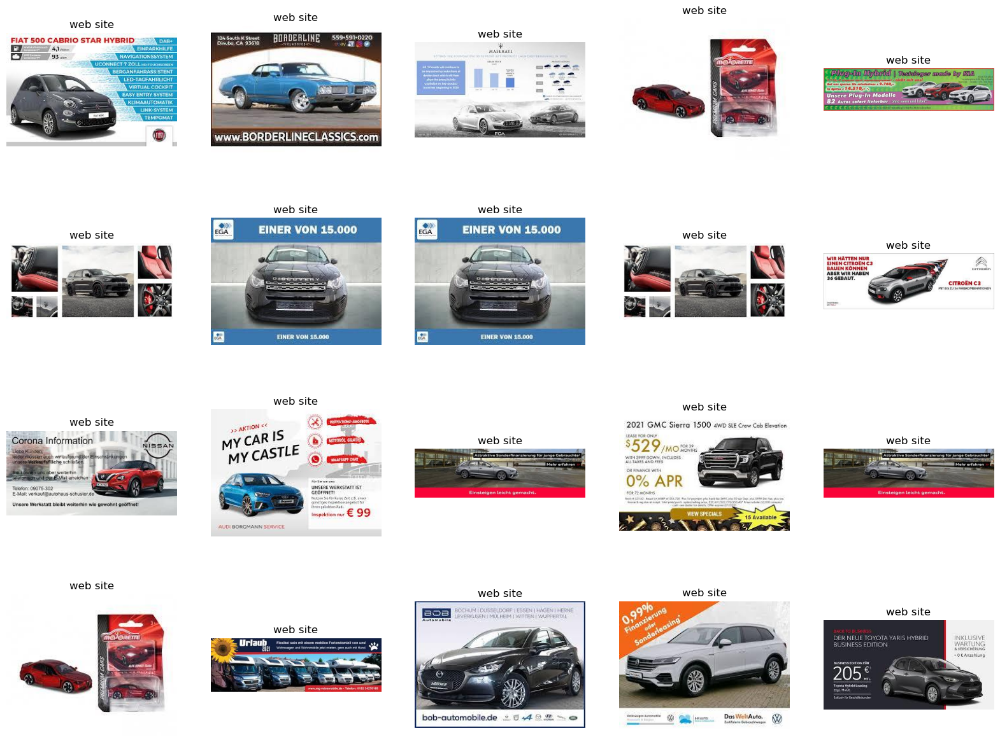

In [55]:
# Filter for a specific noncar label
NONCAR_LABEL = 'web site'
noncar_images_filtered = [(img, label) for img, label in noncar_list if label == NONCAR_LABEL]

N = len(noncar_images_filtered)
samples = [random.randint(0, N - 1) for _ in range(20)] # retrieve 20 random samples
plt.figure(figsize=(20,15))
for i, idx in enumerate(samples):
    img_path, label = noncar_images_filtered[idx]
    plt.subplot(4,5,i+1)
    img = Image.open(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(label)

In [ ]:
# Expand the list of keywords
other_noncar_keywords = [
    "web site","grille","amphibian","snowplow","alp","cassette player",
]

noncar_list = filter_non_car_images(filtered_cardb, car_keywords + other_noncar_keywords)
noncardb = CarDb(noncar_list, transform=transform)

In [ ]:
print(pd.Series(noncardb.labels).value_counts().sort_values(ascending = False).head(15))

label_counts = pd.Series(noncardb.labels).value_counts().sort_index()
label_counts = label_counts[label_counts > 1] # too many labels, plot only > 1 image
# Plot
ax = label_counts.plot(kind='bar', figsize=(12, 6))
plt.title("Class Distribution (# Images per Non Car Label)")
plt.xlabel("Predicted Label")
plt.ylabel("Number of Images")
plt.xticks(rotation=90)

# Add annotations
for i, count in enumerate(label_counts):
    ax.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

### FILTER #2: Filter images with labels different from selected keywords list

In [ ]:
# Filter our images in noncar_list
noncar_paths = {path for path, _ in noncar_list}
filtered_indices = [idx for idx, path in enumerate(filtered_cardb.file_path) if path not in noncar_paths]

filtered_car_list = [(filtered_cardb.file_path[i], filtered_cardb.labels[i]) for i in filtered_indices]

# Create a new dataset instance
filtered_cardb_2 = CarDb(filtered_car_list, label_encoder=label_encoder, transform=transform)

In [72]:
print(len(filtered_cardb.labels) - len(filtered_cardb_2.labels), ' images filtered.')

668  images filtered.


## 3. Image similarity

In [ ]:
from scipy.spatial.distance import cosine

# Calculate pairwise similarity (cosine similarity)
def calculate_similarity(features):
    similarities = []
    for i in range(len(features)):
        for j in range(i + 1, len(features)):
            similarity = 1 - cosine(features[i], features[j])
            similarities.append(similarity)
    return np.array(similarities)

# Calculate pairwise similarities
#similarity_scores = calculate_similarity(features)
#print(f"Mean similarity: {np.mean(similarity_scores)}")

## Final Distribution of Images per class

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_class_distribution(labels):
    counts = pd.Series(labels).value_counts().sort_index()

    # Plot
    ax = counts.plot(kind='bar', figsize=(12, 6))
    plt.title("Class Distribution (Images per Car Brand)")
    plt.xlabel("Car Brand")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=90)

    # Annotations
    for idx, count in enumerate(counts):
        ax.text(idx, count + 1, str(count), ha='center', va='bottom', fontsize=8)
    plt.tight_layout()
    plt.show()

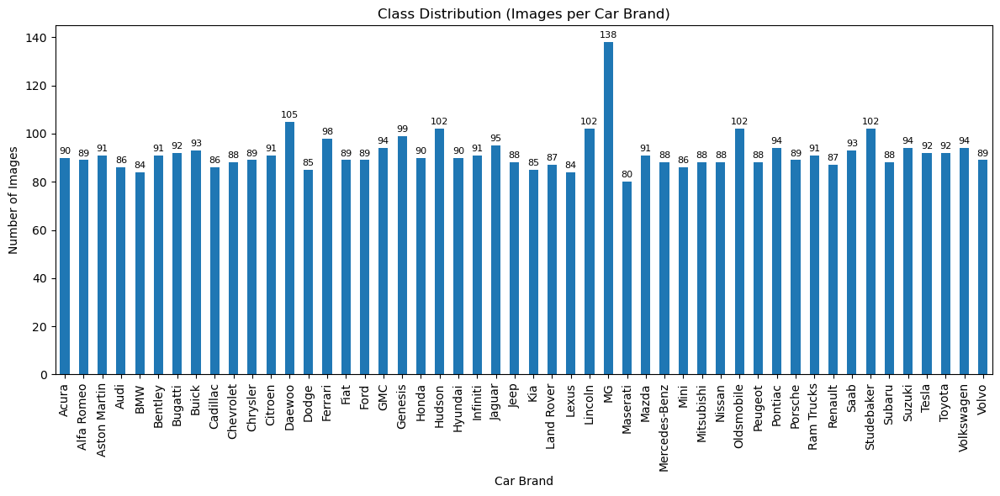

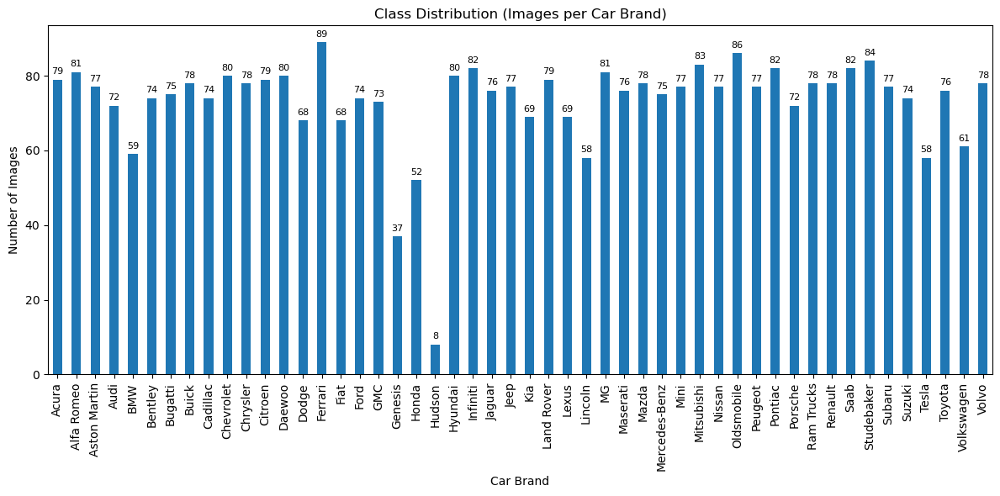

In [73]:
# Convert labels list to pandas Series
plot_class_distribution(cardb.labels)
plot_class_distribution(filtered_cardb_2.labels)

In [77]:
## Delete classes with too few images to train
too_few_to_train = ['Genesis','Honda','Hudson']
filtered_car_list = [(img, label) for img, label in filtered_car_list if label not in too_few_to_train]
filtered_cardb_final = CarDb(filtered_car_list, label_encoder=label_encoder, transform=transform)

In [78]:
print(len(filtered_cardb_final.labels))

3558


In [95]:
# Save my list
import json
with open("filtered_car_list.json", "w") as f:
    json.dump(filtered_car_list, f)

In [13]:
# Load the list from file
import json
with open("filtered_car_list.json", "r") as f:
    filtered_car_list = json.load(f)

filtered_car_list_tuples = [tuple(item) for item in filtered_car_list]
filtered_cardb_final = CarDb(filtered_car_list_tuples, transform=transform)

# Model Training

## Define Model, Optimizer and Loss Function

In [7]:
def train_model(model, train_loader, valid_loader, criterion, optimizer, epochs=10):
    train_losses, valid_losses = [], []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation phase
        model.eval()
        valid_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for (images, labels) in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                valid_loss += loss.item()

                _, predicted = torch.max(outputs, 1)
                correct += (predicted == labels).sum().item()
                total += labels.size(0)

        avg_valid_loss = valid_loss / len(valid_loader)
        valid_losses.append(avg_valid_loss)
        accuracy = 100 * correct / total

        print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {avg_train_loss:.4f}, Valid Loss: {avg_valid_loss:.4f}, Accuracy: {accuracy:.2f}%")

    return train_losses, valid_losses

In [8]:
def evaluate_model(model, test_loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    avg_loss = test_loss / len(test_loader)
    accuracy = 100 * correct / total

    print(f"Test Loss: {avg_loss:.4f}, Test Accuracy: {accuracy:.2f}%")
    return avg_loss, accuracy

In [9]:
def get_predictions_and_labels(model, data_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

# Implementation #1: Original Dataset (Without Filtering)

In [16]:
# Split data into train, val and test
train_df, test_df, val_df = torch.utils.data.random_split(cardb, 
                                                          [0.7, 0.15, 0.15], generator=torch.Generator().manual_seed(42))

loaders = {
    "train": DataLoader(train_df, batch_size=64, shuffle=True),
    "val": DataLoader(val_df, batch_size=64, shuffle=True),
    "test": DataLoader(test_df, batch_size=64, shuffle=True)
}

In [29]:
# Get number of classes
num_classes = len(set(cardb.labels))

# Load pretrained ResNet-50
resnet_model = torchvision.models.resnet50(pretrained=True)
# Modify the last layer for car classification
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, num_classes)
resnet_model = resnet_model.to(device) # Move model to device

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_model.parameters(), lr=0.0001, weight_decay=1e-4)

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [ ]:
# Train the model
train_losses, valid_losses = train_model(resnet_model, loaders['train'], loaders['val'], criterion, optimizer, epochs=15)

# Plot loss curves
plt.plot(train_losses, label="Train Loss")
plt.plot(valid_losses, label="Valid Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

Test Loss: 1.9103, Test Accuracy: 52.75%
1.9102886373346502 52.7536231884058


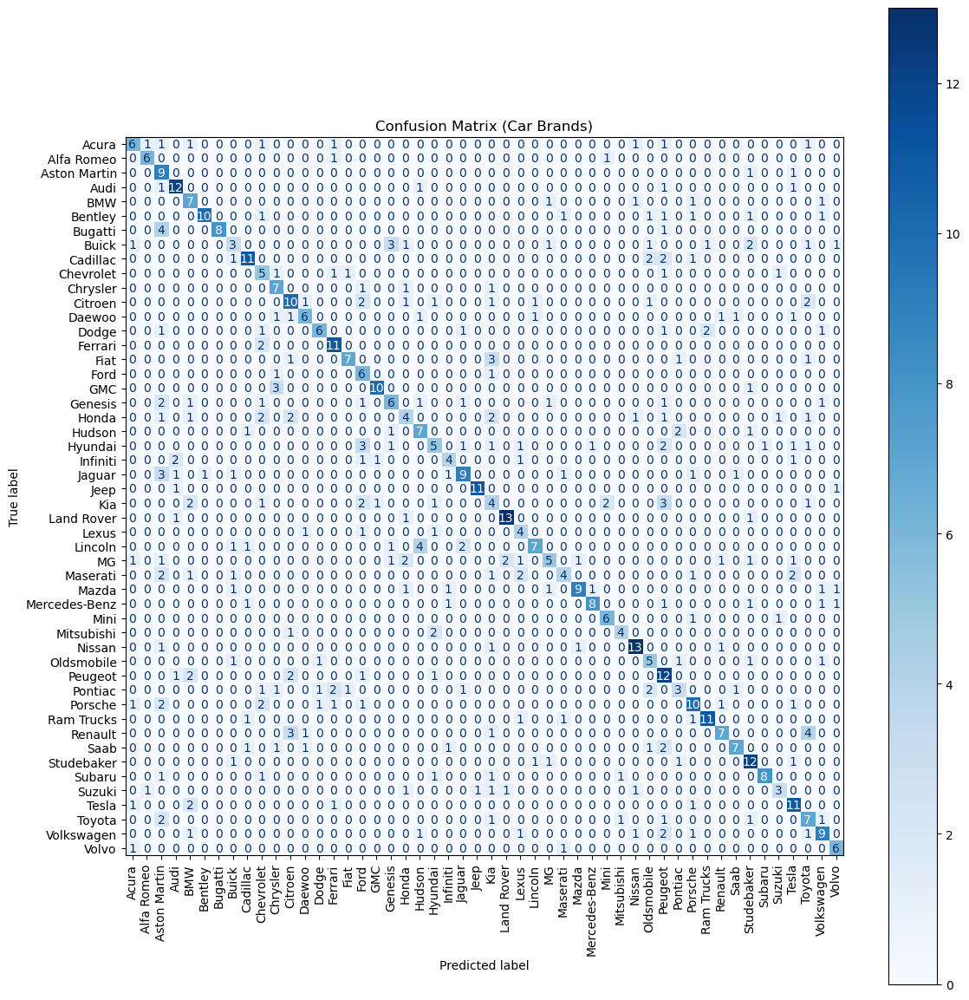

In [69]:
test_loss, test_accuracy = evaluate_model(resnet_model, loaders['test'], criterion)
print(test_loss, test_accuracy)
# Get predictions and true labels
y_pred, y_true = get_predictions_and_labels(resnet_model, loaders['test'])

# Convert to original brand names
raw_y_pred = label_encoder.inverse_transform(y_pred)
raw_y_true = label_encoder.inverse_transform(y_true)

# Compute confusion matrix
class_names = label_encoder.classes_
cm = confusion_matrix(raw_y_true, raw_y_pred, labels=class_names)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix (Car Brands)")
plt.tight_layout()
plt.show()

In [70]:
from sklearn.metrics import accuracy_score

# Compute accuracy per class
per_class_accuracy = {}
for clss in class_names:
    idxs = (raw_y_true == clss)
    acc = accuracy_score(raw_y_true[idxs], raw_y_pred[idxs])
    per_class_accuracy[clss] = acc
    
pd.DataFrame({
    "Brand": list(per_class_accuracy.keys()),
    "Accuracy": list(per_class_accuracy.values())
}).sort_values(by="Accuracy", ascending=False)

,Brand,Accuracy
14,Ferrari,0.846154
24,Jeep,0.846154
2,Aston Martin,0.818182
26,Land Rover,0.812500
35,Nissan,0.764706
49,Volvo,0.750000
3,Audi,0.750000
33,Mini,0.750000
1,Alfa Romeo,0.750000
16,Ford,0.750000


# Implementation #2: ResNet50 on Filtered2 Dataset

In [14]:
# Split data into train, val and test
train_df, test_df, val_df = torch.utils.data.random_split(filtered_cardb_final, 
                                                          [0.7, 0.15, 0.15], generator=torch.Generator().manual_seed(42))

loaders = {
    "train": DataLoader(train_df, batch_size=64, shuffle=True),
    "val": DataLoader(val_df, batch_size=64, shuffle=True),
    "test": DataLoader(test_df, batch_size=64, shuffle=True)
}

In [15]:
# Get number of classes
num_classes = len(set(filtered_cardb_final.labels))

# Load pretrained ResNet-50
resnet_model = torchvision.models.resnet50(pretrained=True)
# Modify the last layer for car classification
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, num_classes)
resnet_model = resnet_model.to(device) # Move model to device


# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet_model.parameters(), lr=0.0001, weight_decay=1e-4)

/home/eqa7yg/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/eqa7yg/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/15], Train Loss: 3.6345, Valid Loss: 3.1780, Accuracy: 17.82%
Epoch [2/15], Train Loss: 2.7814, Valid Loss: 2.7350, Accuracy: 33.02%
Epoch [3/15], Train Loss: 1.9600, Valid Loss: 2.2982, Accuracy: 43.34%
Epoch [4/15], Train Loss: 1.2640, Valid Loss: 2.1655, Accuracy: 47.09%
Epoch [5/15], Train Loss: 0.7359, Valid Loss: 1.8965, Accuracy: 50.84%
Epoch [6/15], Train Loss: 0.3995, Valid Loss: 1.7949, Accuracy: 54.78%
Epoch [7/15], Train Loss: 0.2136, Valid Loss: 1.7675, Accuracy: 55.35%
Epoch [8/15], Train Loss: 0.1247, Valid Loss: 1.7842, Accuracy: 55.91%
Epoch [9/15], Train Loss: 0.0809, Valid Loss: 1.7157, Accuracy: 56.10%
Epoch [10/15], Train Loss: 0.0507, Valid Loss: 1.6676, Accuracy: 57.04%
Epoch [11/15], Train Loss: 0.0412, Valid Loss: 1.7396, Accuracy: 55.91%
Epoch [12/15], Train Loss: 0.0297, Valid Loss: 1.6417, Accuracy: 58.72%
Epoch [13/15], Train Loss: 0.0231, Valid Loss: 1.7145, Accuracy: 57.79%
Epoch [14/15], Train Loss: 0.0160, Valid Loss: 1.6098, Accuracy: 59.10%
E

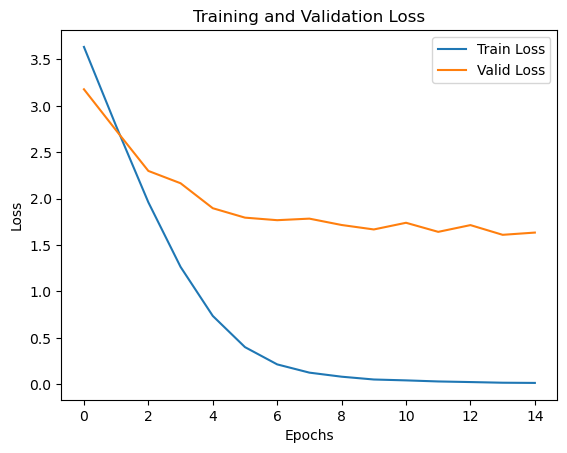

In [16]:
# Train the model
train_losses, valid_losses = train_model(resnet_model, loaders['train'], loaders['val'], criterion, optimizer, epochs=15)

# Plot loss curves
plt.plot(train_losses, label="Train Loss")
plt.plot(valid_losses, label="Valid Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

Test Loss: 1.6975, Test Accuracy: 59.18%
1.6974837250179715 59.176029962546814


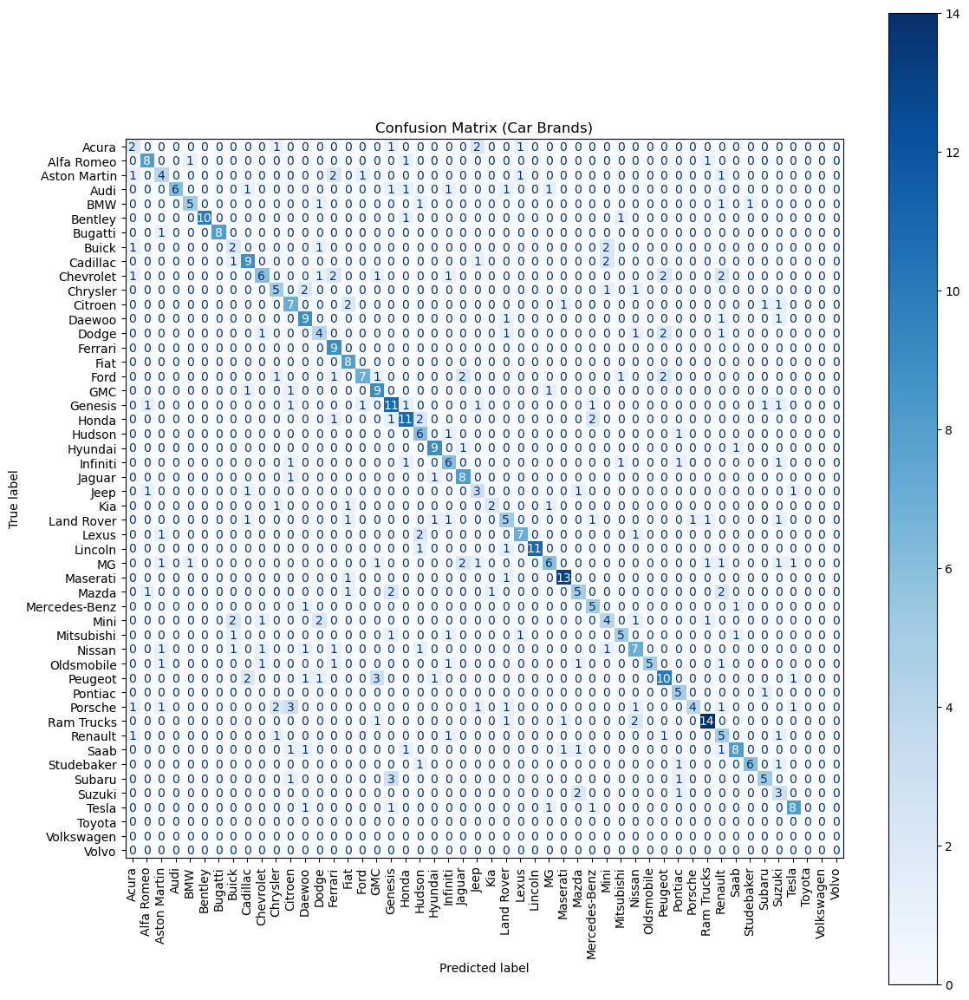

In [18]:
test_loss, test_accuracy = evaluate_model(resnet_model, loaders['test'], criterion)
print(test_loss, test_accuracy)
# Get predictions and true labels
y_pred, y_true = get_predictions_and_labels(resnet_model, loaders['test'])

# Convert to original brand names
raw_y_pred = label_encoder.inverse_transform(y_pred)
raw_y_true = label_encoder.inverse_transform(y_true)

# Compute confusion matrix
class_names = label_encoder.classes_
cm = confusion_matrix(raw_y_true, raw_y_pred, labels=class_names)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix (Car Brands)")
plt.tight_layout()
plt.show()

In [19]:
from sklearn.metrics import accuracy_score

# Compute accuracy per class
per_class_accuracy = {}
for clss in class_names:
    idxs = (raw_y_true == clss)
    acc = accuracy_score(raw_y_true[idxs], raw_y_pred[idxs])
    per_class_accuracy[clss] = acc
    
pd.DataFrame({
    "Brand": list(per_class_accuracy.keys()),
    "Accuracy": list(per_class_accuracy.values())
}).sort_values(by="Accuracy", ascending=False)

/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/apps/software/standard/core/jupyterlab/3.6.3-py3.11/lib/python3.11/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/apps/software/standard/cor

,Brand,Accuracy
15,Fiat,1.000000
14,Ferrari,1.000000
6,Bugatti,0.888889
30,Maserati,0.866667
28,Lincoln,0.846154
38,Pontiac,0.833333
5,Bentley,0.833333
21,Hyundai,0.818182
23,Jaguar,0.800000
12,Daewoo,0.750000


In [20]:
# A different model: RexNet150

In [161]:
import timm

# RexNet 50
rexnet_model = timm.create_model('rexnet_150', pretrained=True)

# Modify the last layer for car classification
in_features = rexnet_model.head.fc.in_features  # Original final FC layer input size
rexnet_model.head = nn.Sequential(
    nn.AdaptiveAvgPool2d(1),
    nn.Flatten(1),
    nn.Dropout(0.2),
    nn.Linear(in_features, num_classes)
)
rexnet_model = rexnet_model.to(device) # Move model to device

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(rexnet_model.parameters(), lr=0.0001, weight_decay=1e-4)

Epoch [1/15], Train Loss: 3.8520, Valid Loss: 3.7487, Accuracy: 14.36%
Epoch [2/15], Train Loss: 3.4791, Valid Loss: 3.3622, Accuracy: 21.33%
Epoch [3/15], Train Loss: 2.9477, Valid Loss: 2.9202, Accuracy: 29.71%
Epoch [4/15], Train Loss: 2.3983, Valid Loss: 2.5565, Accuracy: 38.74%
Epoch [5/15], Train Loss: 1.8357, Valid Loss: 2.2373, Accuracy: 46.79%
Epoch [6/15], Train Loss: 1.3498, Valid Loss: 2.0318, Accuracy: 51.58%
Epoch [7/15], Train Loss: 0.9455, Valid Loss: 1.8446, Accuracy: 53.65%
Epoch [8/15], Train Loss: 0.6400, Valid Loss: 1.8465, Accuracy: 54.19%
Epoch [9/15], Train Loss: 0.4100, Valid Loss: 1.8400, Accuracy: 54.52%
Epoch [10/15], Train Loss: 0.2566, Valid Loss: 1.8347, Accuracy: 55.39%
Epoch [11/15], Train Loss: 0.1638, Valid Loss: 1.8402, Accuracy: 55.06%
Epoch [12/15], Train Loss: 0.1073, Valid Loss: 1.8606, Accuracy: 56.69%
Epoch [13/15], Train Loss: 0.0818, Valid Loss: 1.8979, Accuracy: 56.80%
Epoch [14/15], Train Loss: 0.0596, Valid Loss: 1.8307, Accuracy: 57.45%
E

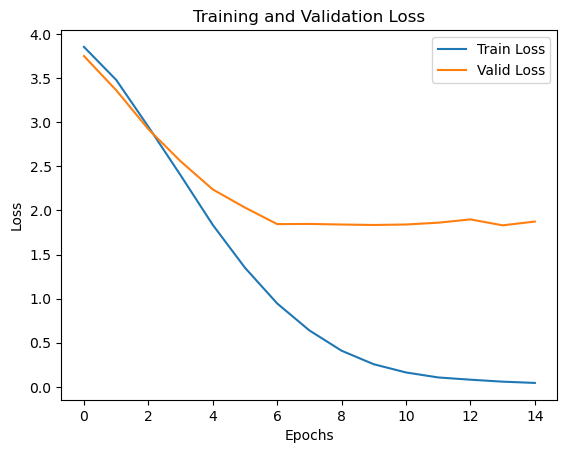

In [162]:
# Train the model
train_losses, valid_losses = train_model(rexnet_model, loaders['train'], loaders['val'], criterion, optimizer, epochs=15)

# Plot loss curves
plt.plot(train_losses, label="Train Loss")
plt.plot(valid_losses, label="Valid Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

Test Loss: 1.8896, Test Accuracy: 57.78%
1.8896249850591025 57.78019586507073


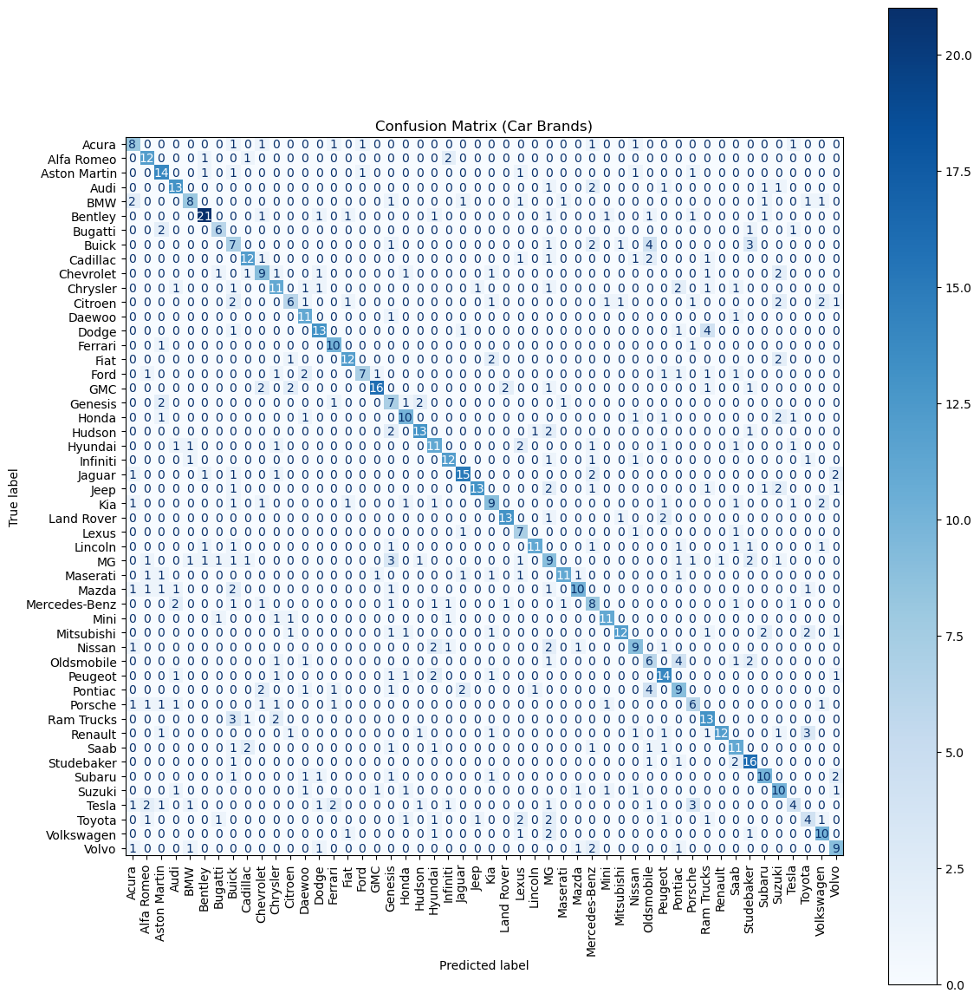

In [164]:
test_loss, test_accuracy = evaluate_model(rexnet_model, loaders['val'], criterion)
print(test_loss, test_accuracy)
# Get predictions and true labels
y_pred, y_true = get_predictions_and_labels(rexnet_model, loaders['val'])

# Convert to original brand names
raw_y_pred = label_encoder.inverse_transform(y_pred)
raw_y_true = label_encoder.inverse_transform(y_true)

# Compute confusion matrix
class_names = label_encoder.classes_
cm = confusion_matrix(raw_y_true, raw_y_pred, labels=class_names)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix (Car Brands)")
plt.tight_layout()
plt.show()

# Kurt's Implementation

Epoch [1/10], Train Loss: 0.5964, Valid Loss: 0.4865, Accuracy: 87.18%
Epoch [2/10], Train Loss: 0.3412, Valid Loss: 0.2213, Accuracy: 93.89%
Epoch [3/10], Train Loss: 0.1534, Valid Loss: 0.1026, Accuracy: 97.74%
Epoch [4/10], Train Loss: 0.0720, Valid Loss: 0.0637, Accuracy: 98.52%
Epoch [5/10], Train Loss: 0.0495, Valid Loss: 0.0596, Accuracy: 98.58%
Epoch [6/10], Train Loss: 0.0270, Valid Loss: 0.0600, Accuracy: 98.64%
Epoch [7/10], Train Loss: 0.0216, Valid Loss: 0.0385, Accuracy: 99.05%
Epoch [8/10], Train Loss: 0.0179, Valid Loss: 0.0360, Accuracy: 99.35%
Epoch [9/10], Train Loss: 0.0172, Valid Loss: 0.0336, Accuracy: 99.11%
Epoch [10/10], Train Loss: 0.0101, Valid Loss: 0.0277, Accuracy: 99.23%


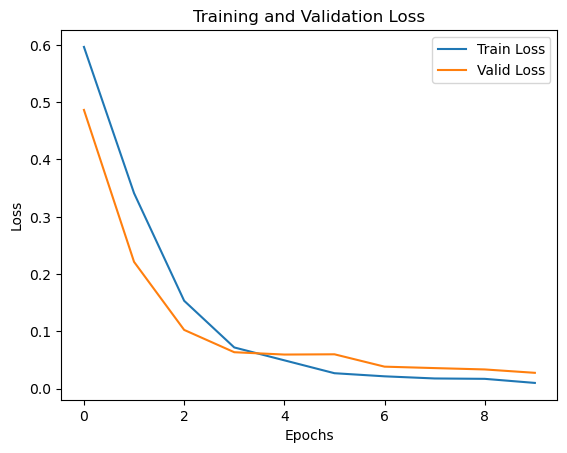

CPU times: user 10min 47s, sys: 16.8 s, total: 11min 4s
Wall time: 4min 34s


In [131]:
%%time

# Directories
train_dir = "/home/nps3cs/Documents/MSDS/SpringMSDS/carData/car_imgs/train"
valid_dir = "/home/nps3cs/Documents/MSDS/SpringMSDS/carData/car_imgs/valid"

# Load datasets
train_dataset = ImageFolder(root=train_dir, transform=transform)
valid_dataset = ImageFolder(root=valid_dir, transform=transform)

# Dataloaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

# Train the model
train_losses, valid_losses = train_model(resnet_model, train_loader, valid_loader, criterion, optimizer, epochs=10)

# Save the model
torch.save(resnet_model.state_dict(), "resnet_car_classifier.pth")

# Plot loss curves
plt.plot(train_losses, label="Train Loss")
plt.plot(valid_losses, label="Valid Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training and Validation Loss")
plt.show()

Test Loss: 0.0279, Test Accuracy: 99.41%
0.027894553120454982 99.40652818991099


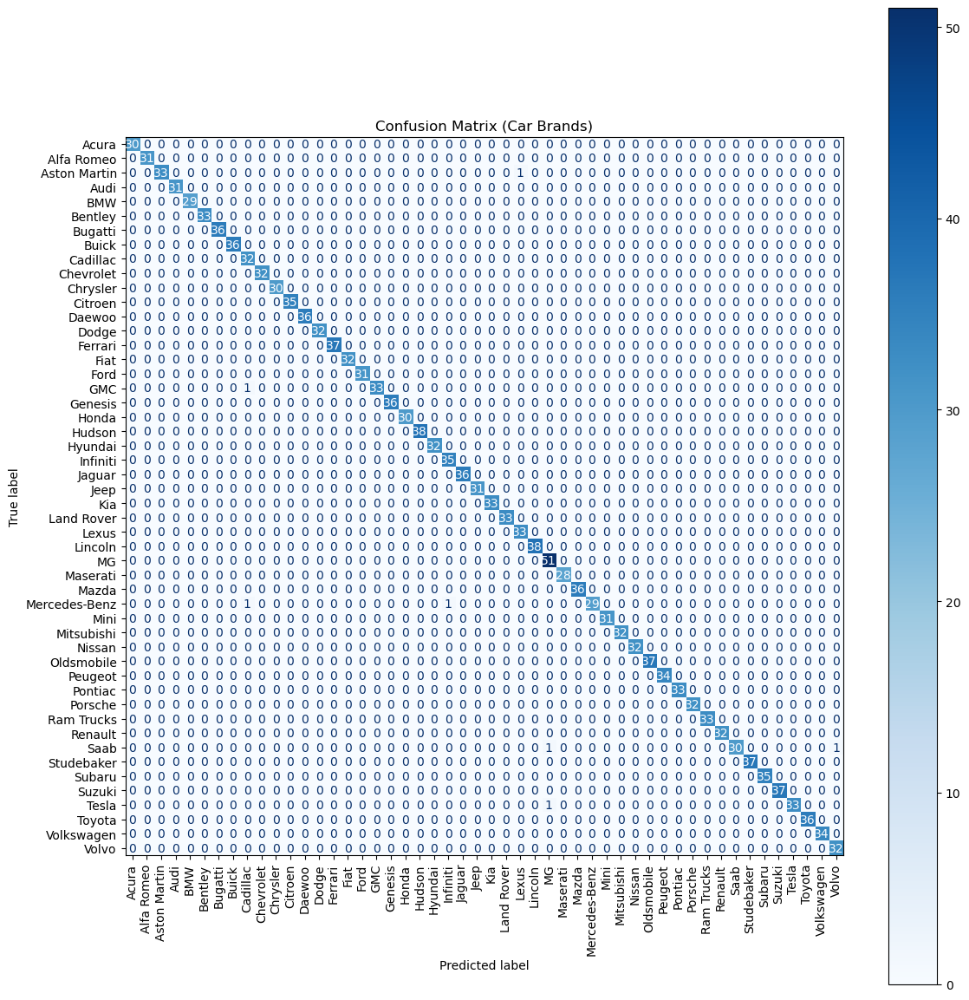

In [134]:
test_loss, test_accuracy = evaluate_model(resnet_model, valid_loader, criterion)
print(test_loss, test_accuracy)
# Get predictions and true labels
y_pred, y_true = get_predictions_and_labels(resnet_model, valid_loader)

# Convert to original brand names
raw_y_pred = label_encoder.inverse_transform(y_pred)
raw_y_true = label_encoder.inverse_transform(y_true)

# Compute confusion matrix
class_names = label_encoder.classes_
cm = confusion_matrix(raw_y_true, raw_y_pred, labels=class_names)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(12, 12))
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation=90)
plt.title("Confusion Matrix (Car Brands)")
plt.tight_layout()
plt.show()

In [154]:
# Number of images in Train/Val and Original datasets
print('Train dataset should have: ', len(train_df))
print('Validation dataset should have: ', len(val_df))
print('In total ', len(car_list), ' images.')

# Number of images in train and val folders
img_paths = glob.glob(train_dir+'/**/*.jpg', recursive=True)
print(f"Total .jpg images (recursive): {len(img_paths)}")
img_paths = glob.glob(valid_dir+'/**/*.jpg', recursive=True)
print(f"Total .jpg images (recursive): {len(img_paths)}")

Train dataset should have:  3678
Validation dataset should have:  919
In total  4597  images.
Total .jpg images (recursive): 4404
Total .jpg images (recursive): 1685
